# Analysis of spectral data and bathymetry
### Monterey Bay


In this notebook, we create a grid of roughtly square cells over the Monterey Bay area.
For each cell, we merge bathymetry data with spectral data from the Landsat 8 satellite.

Landsat Images downloaded from https://earthexplorer.usgs.gov  
This is Path: 44, Row: 34 (Monterey Bay)  
Image ID: LC08_L1TP_044034_20180601_20180614_01_T1  
Acquisition Date: 01-JUN-18  

Grid Cell Size Thermal	30  
UL Corner Lat	38°31'36.16"N  
UL Corner Long	122°54'01.87"W  
UR Corner Lat	38°07'35.90"N  
UR Corner Long	120°46'42.06"W  
LL Corner Lat	36°48'24.41"N  
LL Corner Long	123°23'28.00"W  
LR Corner Lat	36°24'28.84"N  
LR Corner Long	121°19'01.31"W  
Center Latitude dec	37.47464  
Center Longitude dec	-122.09522  
UL Corner Lat dec	38.52671  
UL Corner Long dec	-122.90052  
UR Corner Lat dec	38.12664  
UR Corner Long dec	-120.77835  
LL Corner Lat dec	36.80678  
LL Corner Long dec	-123.39111  
LR Corner Lat dec	36.40801  
LR Corner Long dec	-121.31703  

In [1]:
# note: notebook optimized for Python 3
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from collections import namedtuple
import xarray as xr
import os
import urllib

# on the mac, install with conda install gdal
from osgeo import osr, gdal

%matplotlib inline

In [3]:
# load images for all bands plus the color image
# note: matplotlib can only handle png natively
# pip install pillow to add support for more image types

dir_name = "data"
gcs_spectral_bucket = "https://storage.googleapis.com/w210data/data/spectral/tiles/044034/"
gcs_bathymetry_bucket = "https://storage.googleapis.com/w210data/data/bathymetry/coastal_relief_maps/"
gcs_biomass_bucket = "https://storage.googleapis.com/w210data/data/kelp_biomass/"

if not os.path.isdir(dir_name):
    os.mkdir(dir_name)
    
def download_file(file_name, gcs_bucket):
    full_path = os.path.join(dir_name, file_name)
    if not os.path.exists(full_path):
        urllib.request.urlretrieve (gcs_bucket+file_name, full_path)

def load_image(file_name, gcs_bucket):
    download_file(file_name, gcs_bucket)
    full_path = os.path.join(dir_name, file_name)
    return plt.imread(full_path)

b4_file = "LC08_L1TP_044034_20180601_20180614_01_T1_B4.TIF" # red
b5_file = "LC08_L1TP_044034_20180601_20180614_01_T1_B5.TIF" # infrared
color_file = "LC08_L1TP_044034_20180601_20180614_01_T1.jpg"

b4 = load_image(b4_file, gcs_spectral_bucket)
b5 = load_image(b5_file, gcs_spectral_bucket)
color = load_image(color_file, gcs_spectral_bucket)

In [3]:
# get the existing coordinate system
ds = gdal.Open(os.path.join(dir_name, b4_file))

old_cs = osr.SpatialReference()
old_cs.ImportFromWkt(ds.GetProjectionRef())

# create the new coordinate system
wgs84_wkt = """
GEOGCS["WGS 84",
    DATUM["WGS_1984",
        SPHEROID["WGS 84",6378137,298.257223563,
            AUTHORITY["EPSG","7030"]],
        AUTHORITY["EPSG","6326"]],
    PRIMEM["Greenwich",0,
        AUTHORITY["EPSG","8901"]],
    UNIT["degree",0.01745329251994328,
        AUTHORITY["EPSG","9122"]],
    AUTHORITY["EPSG","4326"]]"""
new_cs = osr.SpatialReference()
new_cs.ImportFromWkt(wgs84_wkt)

# create a transform object to convert between coordinate systems
transform = osr.CoordinateTransformation(old_cs, new_cs) 
gt = ds.GetGeoTransform()

def getLonLat(x, y):
    coord_x = gt[0] + x*gt[1] 
    coord_y = gt[3] + y*gt[5] 

    #get the coordinates in lat long
    latlong = transform.TransformPoint(coord_x, coord_y, 0.0) 
    return latlong[0], latlong[1] 


def getLat(x, y):
    return getLonLat(x, y)[1] 

def getLon(x, y):
    return getLonLat(x, y)[0] 

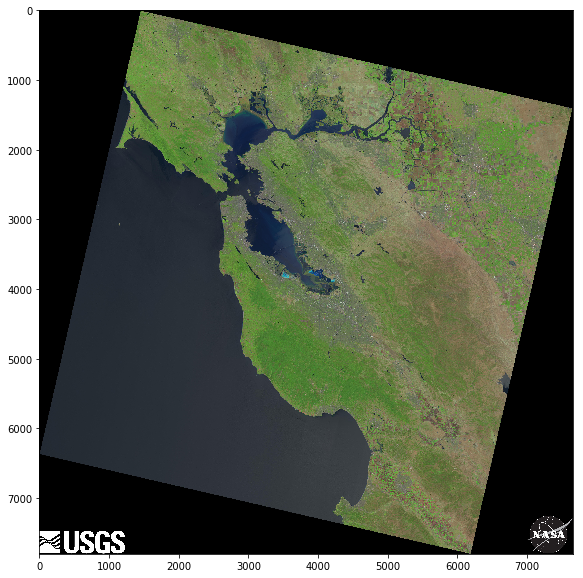

In [5]:
plt.figure(figsize = (10,10))

plt.imshow(color)

## Basic Statistics

In [6]:
top_left = (-123.39111, 38.52671)
bottom_right = (-120.77835, 36.40801)

image_height = color.shape[0] 
image_width = color.shape[1] 

grid_size_h = 300
grid_size_v = 300

cell_size_h = (bottom_right[0] - top_left[0]) / grid_size_h
cell_size_v = (top_left[1] - bottom_right[1]) / grid_size_v

cell_size_pixel_h = int(image_width / grid_size_h)
cell_size_pixel_v = int(image_height / grid_size_v)

# adjust boundaries so there's an integer number of cells in the grid
image_width = cell_size_pixel_h * grid_size_h
image_height = cell_size_pixel_v * grid_size_v

bottom_right = (cell_size_h * grid_size_h + top_left[0],
                -(cell_size_v*grid_size_v-top_left[1]))

print ("Image size: " + str(image_width) + " by " + str(image_height))

print ("Grid size: " + str(grid_size_h) + " by " + str(grid_size_v))

print ("Cell size: " + str(cell_size_h) + " by " + str(cell_size_v))
print ("Pixel cell size: " + str(cell_size_pixel_h) + " by " + str(cell_size_pixel_v))

lon_size_deg = bottom_right[0]-top_left[0]
lat_size_deg = top_left[1]-bottom_right[1]

lon_size_km = lon_size_deg*111 # 1 degree is approximately 111 km
lat_size_km = lat_size_deg*111

print ("Area is approx. " + str(lon_size_km) + " by " + str(lat_size_km) + " km")

b4 = b4[0:image_height, 0:image_width]
b5 = b5[0:image_height, 0:image_width]
color = color[0:image_height, 0:image_width]

Image size: 7500 by 7800
Grid size: 300 by 300
Cell size: 0.008709199999999981 by 0.007062333333333347
Pixel cell size: 25 by 26
Area is approx. 290.0163599999994 by 235.17570000000046 km


## Create grid

In [7]:
# compute grid - fast vector implementation

grid = pd.DataFrame(index=np.arange(0, grid_size_h*grid_size_v), columns=["i", "j", "top", "left", "bottom", "right", "pxtop", "pxleft", "pxbottom", "pxright"])

grid["i"] = np.arange(0, grid_size_v).repeat(grid_size_h)
grid["j"] = np.tile(np.arange(0, grid_size_h), grid_size_v)


grid["pxleft"] = grid["j"] * cell_size_pixel_h
grid["pxright"] = grid["pxleft"] + cell_size_pixel_h - 1
grid["pxtop"] = grid["i"] * cell_size_pixel_v
grid["pxbottom"]  = grid["pxtop"] + cell_size_pixel_v - 1


In [8]:
left = np.arange(0, image_width, cell_size_pixel_h)
top = np.arange(0, image_height, cell_size_pixel_v)
right = left + cell_size_pixel_h
bottom = top + cell_size_pixel_v


left_lon = [getLon(x,0) for x in left]
top_lat = [getLat(0,y) for y in top]

right_lon = [getLon(x,0) for x in right]
bottom_lat = [getLat(0,y) for y in bottom]


grid["top"] = np.array(top_lat).repeat(grid_size_h)
grid["left"] = np.tile(left_lon, grid_size_v)

grid["bottom"] = np.array(bottom_lat).repeat(grid_size_h)
grid["right"] = np.tile(right_lon, grid_size_v)


In [9]:
# overlay grid on image
color2 = np.array(color)

thickness = 1
grid_color = [255, 255, 255]

for col in range(0, image_width, cell_size_pixel_h):
    color2[0:image_height, col-thickness:col+thickness ] = grid_color

for row in range(0, image_height, cell_size_pixel_v):
    color2[row-thickness:row+thickness, 0:image_width] = grid_color


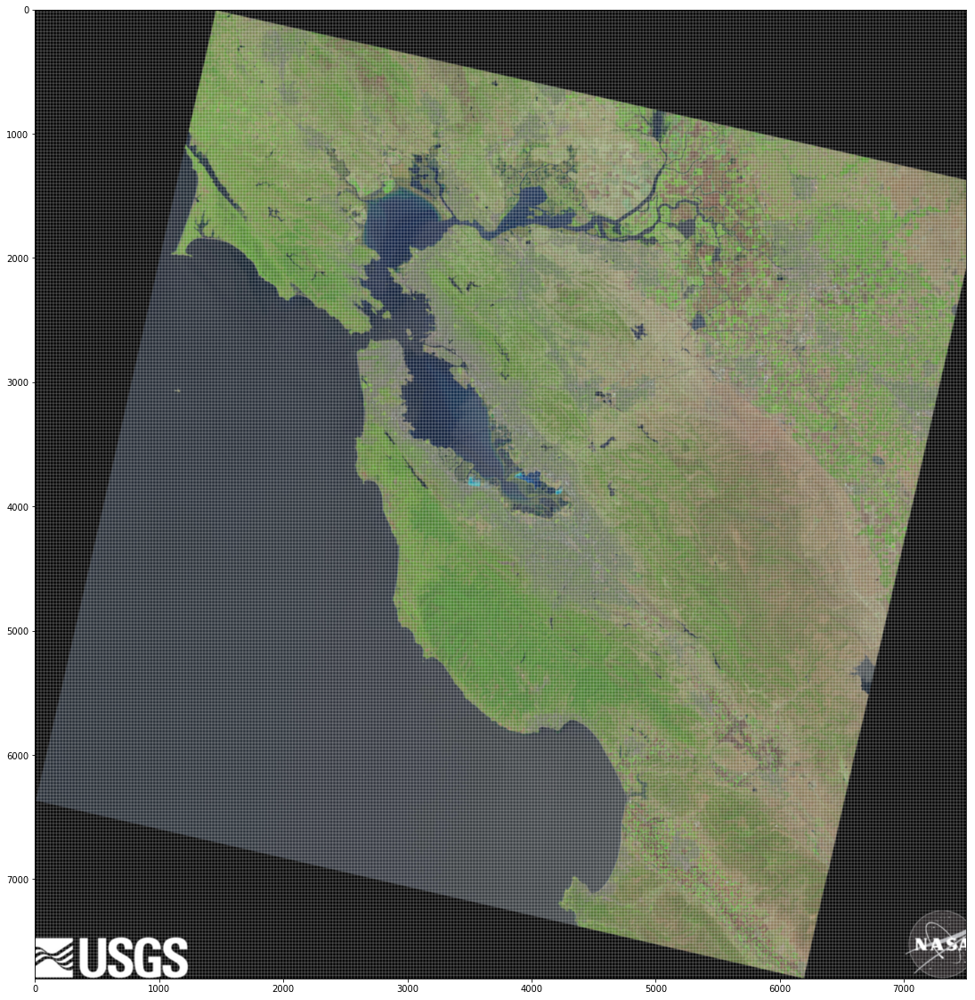

In [10]:
plt.figure(figsize = (20,20))
plt.imshow(color2,
           interpolation="bicubic")
#plt.imsave(arr=color2, fname="out.jpg")

## Load bathymetry data

In [11]:
# load depth dataset
bathymetry_file = "crm_vol6.nc" # south Cal
download_file(bathymetry_file, gcs_bathymetry_bucket)

depth = xr.open_dataset(os.path.join(dir_name, bathymetry_file)).to_dataframe()
depth = depth.reset_index().dropna()

depth.columns = ["lon", "lat", "depth"]

In [12]:
depth["j"] = np.searchsorted(left_lon, depth["lon"])+1
depth["i"] = np.searchsorted(-1*np.array(top_lat), -1*depth["lat"] )-1

In [13]:
filtered_depth = pd.DataFrame(depth[(depth["i"]>0) & (depth["j"]>0) & (depth["i"]<=grid_size_v) & (depth["j"]<=grid_size_h)])

In [14]:
filtered_depth["idx"] = filtered_depth["i"]*grid_size_h+filtered_depth["j"]

In [15]:
# aggregate depth data based on the grid defined above
d = pd.DataFrame(filtered_depth.groupby(['idx'])['depth'].agg(['max', 'mean'])) # max and mean depth in cell
d.columns = ["max_depth", "mean_depth"]

In [16]:
grid = grid.join(d)

In [17]:
def highlight_cell(image, color, row, force=False):
    cell = image[row.pxtop:row.pxbottom, row.pxleft:row.pxright]
    if force:
        cell = color
    else:
        cell = np.multiply(cell, color)
    image[row.pxtop:row.pxbottom, row.pxleft:row.pxright] = np.minimum(cell, [255,255,255]).astype(int)    

In [18]:
# highlight cells with mean_depth<0
for row in grid.itertuples():
    if pd.isnull(row.mean_depth):
        highlight_cell(color2, [0.5,0.5,0.5], row)
    else:
        if row.mean_depth>0:
            highlight_cell(color2, [0.5,0.5,0.5], row)

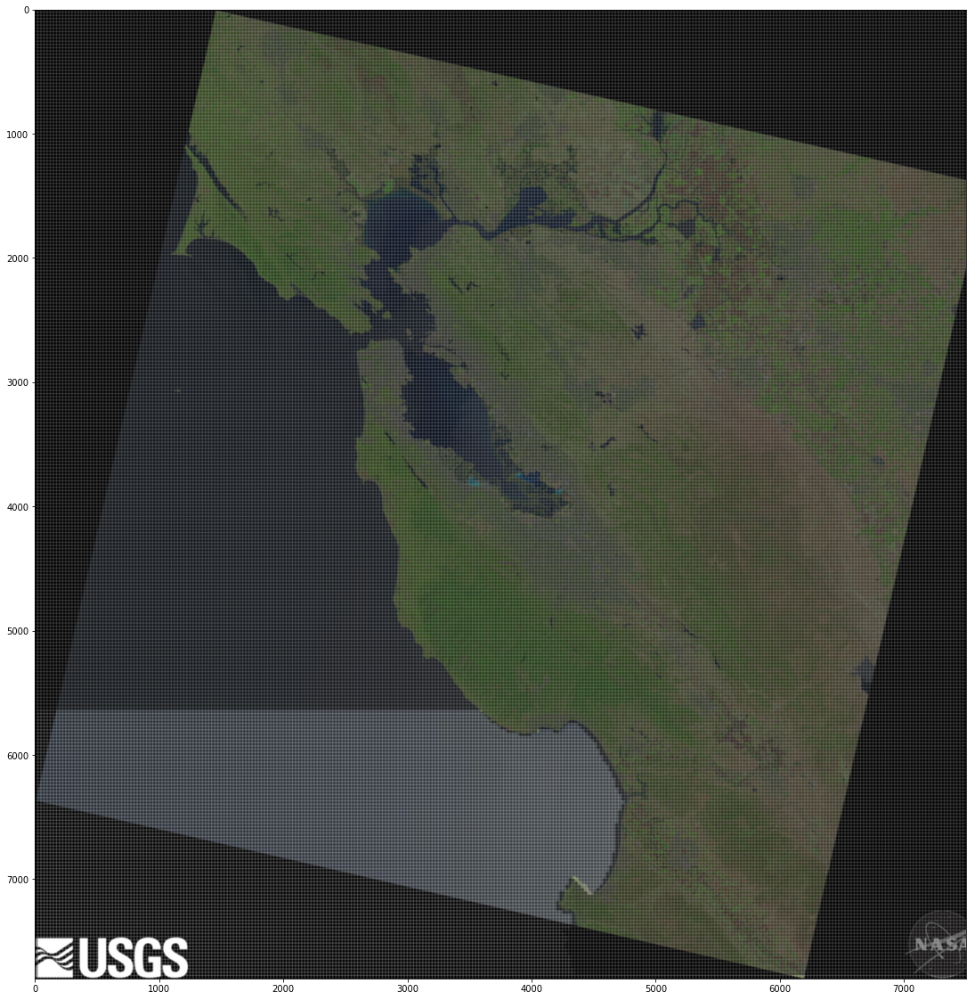

In [19]:
plt.figure(figsize = (20,20))
plt.imshow(color2, interpolation="bicubic")
#plt.imsave(arr=color2, fname="out.jpg")

### Now merge with spectral data

In [20]:
# compute NDVI based on bands B4 (red) and B5 (infrared)
ir_float = b5.astype(float)
red_float = b4.astype(float)
den = ir_float + red_float
den[den==0] = np.nan
ndvi = np.divide(ir_float - red_float, den)

In [21]:
# create a new dataframe to hold the ndvi value for each cell in the grid
# to get the ndvi for each cell, we compute the mean ndvi value for all image pixels 
# that fall in that cell
ndvi_grid = pd.DataFrame(index=np.arange(0, grid_size_h*grid_size_v), columns=["mean_ndvi"])

for i in range(0, grid_size_v):
    for j in range(0, grid_size_h):
        # find the boundaries (in pixel coordinates) of this grid cell
        pxleft = j * cell_size_pixel_h
        pxright = pxleft + cell_size_pixel_h - 1
        pxtop = i * cell_size_pixel_v
        pxbottom = pxtop + cell_size_pixel_v - 1
        # extract all image pixels within the boundaries
        myslice = ndvi[pxtop:pxbottom, pxleft:pxright].reshape(-1)
        # average the NDVI fot the extracted pixels
        mymean = np.mean(myslice)
        # save value in the NDVI dataframe at the corresponding location
        ndvi_grid.loc[i*grid_size_h+j] = [mymean]
        

In [22]:
grid = grid.join(ndvi_grid)
grid["mean_ndvi"] = grid["mean_ndvi"].astype(float)

In [23]:
ndvi_values = pd.DataFrame(grid[grid["mean_depth"]<0]).dropna()

In [24]:
filter_ndvi = ndvi_values["mean_ndvi"].quantile(0.99)
print(filter_ndvi)

-0.02137844055098542


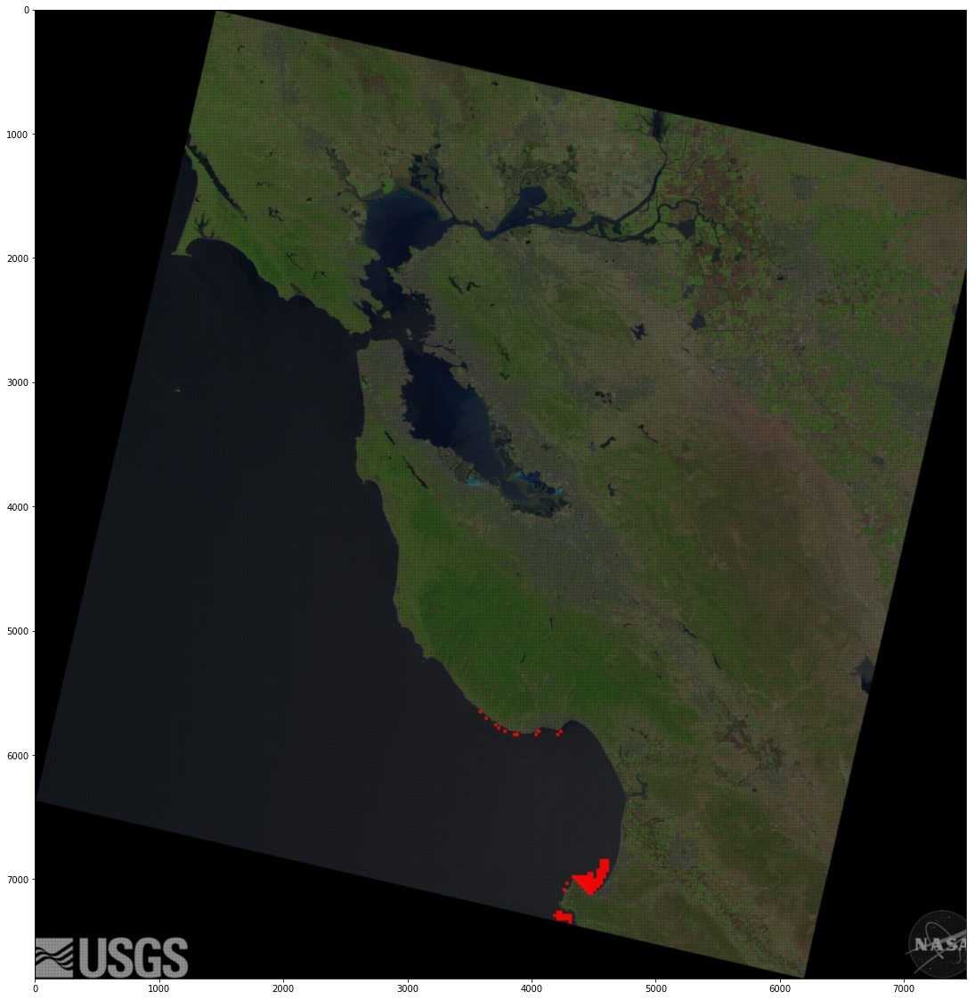

In [25]:
color3 = np.array(color)

# highlight cells with ndvi>filter_ndvi and depth<0
for row in grid.itertuples():
    if row.mean_depth<0 and row.mean_ndvi>filter_ndvi:
        highlight_cell(color3, [255,0,0], row, True)
    else:
        highlight_cell(color3, [0.5,0.5,0.5], row)

plt.figure(figsize = (20,20))
plt.imshow(color3, interpolation="bicubic")

## Mean water depth where kelp grows

In [26]:
kelp = grid[grid["mean_ndvi"]>filter_ndvi].copy()

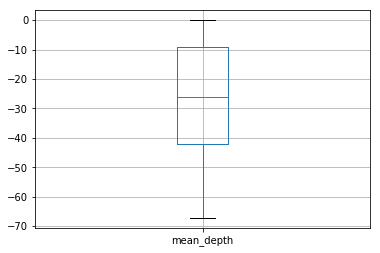

In [27]:
kelp[kelp["mean_depth"]<0].boxplot("mean_depth")

## Next step: compare against existing biomass dataset

In [28]:
biomass_file = "LandsatKelpBiomass_2017.nc"
download_file(biomass_file, gcs_biomass_bucket)

kelp_biomass = xr.open_dataset(os.path.join(dir_name, biomass_file)).to_dataframe()

In [29]:
kelp_biomass_2015 = kelp_biomass[kelp_biomass["year"]==2015]
kelp_biomass_Q2_2015 = kelp_biomass_2015[kelp_biomass_2015["quarter"]==2].copy()

In [30]:
kelp_biomass_Q2_2015["j"] = np.searchsorted(left_lon, kelp_biomass_Q2_2015["lon"])+1
kelp_biomass_Q2_2015["i"] = np.searchsorted(-1*np.array(top_lat), -1*kelp_biomass_Q2_2015["lat"] )-1

In [31]:
kelp_biomass_Q2_2015["idx"] = kelp_biomass_Q2_2015["i"]*grid_size_h+kelp_biomass_Q2_2015["j"]

filtered_biomass = kelp_biomass_Q2_2015[(kelp_biomass_Q2_2015["i"]>0) & (kelp_biomass_Q2_2015["j"]>0) & (kelp_biomass_Q2_2015["i"]<=grid_size_v) & (kelp_biomass_Q2_2015["j"]<=grid_size_h)]

In [32]:
d = pd.DataFrame(filtered_biomass.groupby(['idx'])['biomass'].agg('mean')) # mean biomass in cell
grid = grid.join(d)

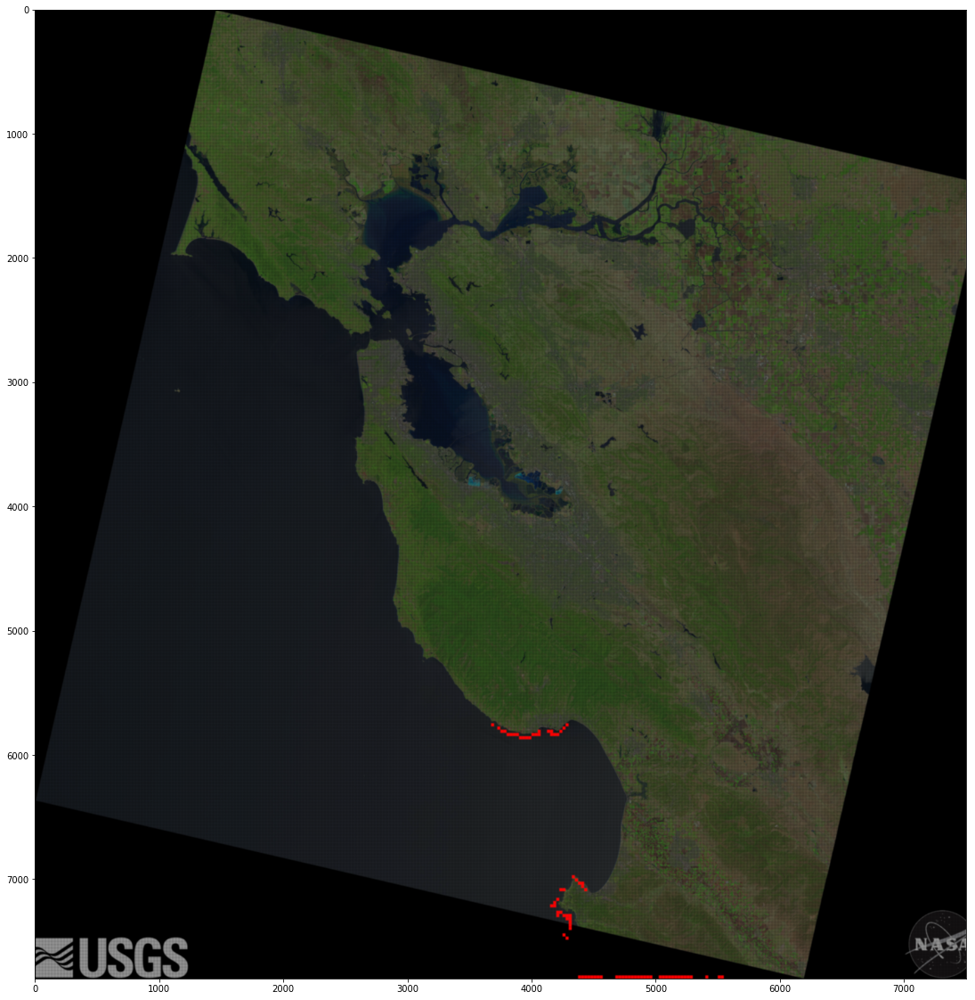

In [33]:
color4 = np.array(color)

# highlight cells with ndvi>0 and depth<0
for row in grid.itertuples():
    if row.biomass>0 and row.mean_depth<0:
        highlight_cell(color4, [255, 0, 0], row, True)
    else:
        highlight_cell(color4, [0.5,0.5,0.5], row)

plt.figure(figsize = (20,20))
plt.imshow(color4, interpolation="bicubic")

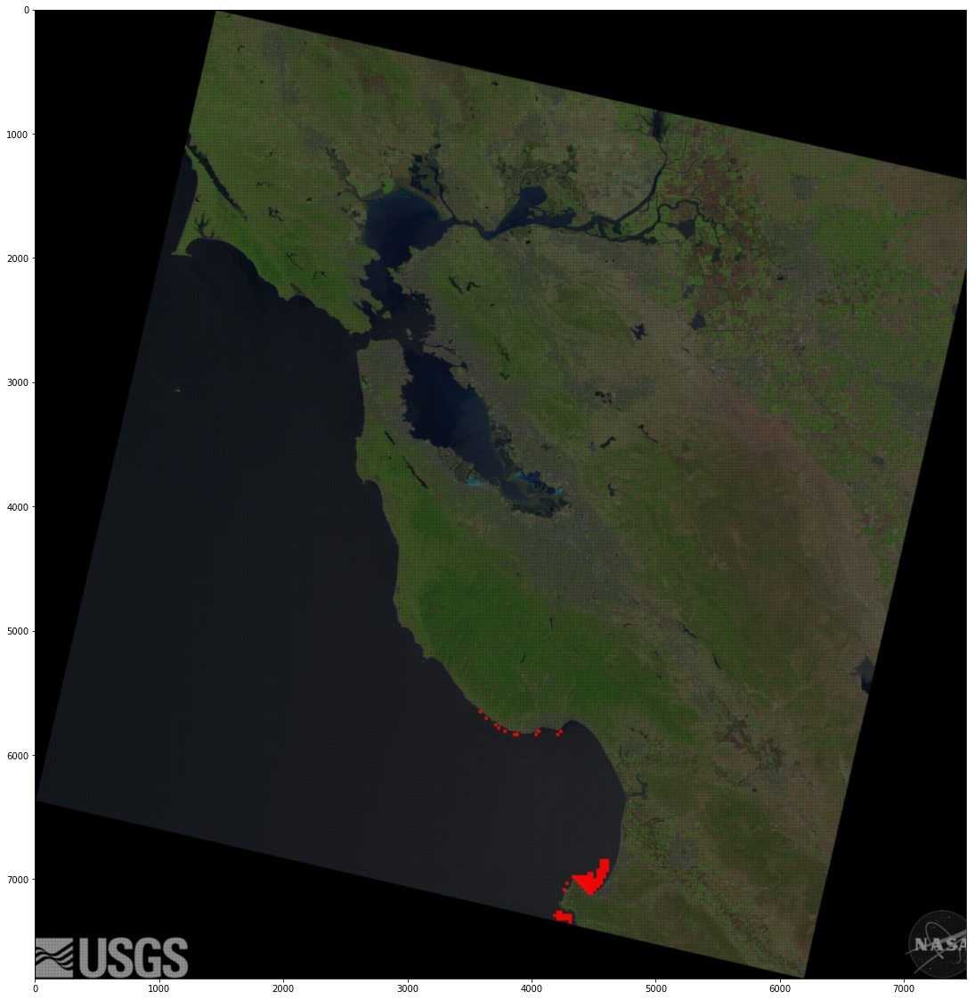

In [34]:
plt.figure(figsize = (20,20))

plt.imshow(color3, interpolation="bicubic")

In [35]:
sea = grid[grid["mean_depth"] < 0].copy()
kelp = sea[sea["mean_ndvi"] > filter_ndvi].copy()


In [36]:
kelp

,i,j,top,left,bottom,right,pxtop,pxleft,pxbottom,pxright,max_depth,mean_depth,mean_ndvi,biomass
65243,217,143,37.002797,-122.171304,36.995766,-122.162701,5642,3575,5667,3599,27.000000,-0.059091,0.008434,NaN
65845,219,145,36.988735,-122.154098,36.981703,-122.145494,5694,3625,5719,3649,26.000000,-4.495000,-0.020347,0.000000
66448,221,148,36.974672,-122.128288,36.967641,-122.119685,5746,3700,5771,3724,20.000000,-1.545000,0.014294,0.000000
66749,222,149,36.967641,-122.119685,36.960610,-122.111082,5772,3725,5797,3749,19.000000,-6.692929,-0.020140,691.989247
67051,223,151,36.960610,-122.102478,36.953579,-122.093875,5798,3775,5823,3799,14.000000,-6.823750,-0.014558,1032.374194
67062,223,162,36.960610,-122.007846,36.953579,-121.999243,5798,4050,5823,4074,5.000000,-2.488636,0.086192,130.520000
67069,223,169,36.960610,-121.947627,36.953579,-121.939025,5798,4225,5823,4249,-0.800000,-7.955000,-0.013498,493.038123
67354,224,154,36.953579,-122.076669,36.946548,-122.068066,5824,3850,5849,3874,15.000000,-6.382222,-0.017707,366.471910
67355,224,155,36.953579,-122.068066,36.946548,-122.059463,5824,3875,5849,3899,16.000000,-1.541111,-0.019320,300.887500
67361,224,161,36.953579,-122.016449,36.946548,-122.007846,5824,4025,5849,4049,13.000000,-3.024444,-0.008521,455.333333
